# Homework 5: ML Security 
## Deadline: 11:59 pm, Thursday, November 9, 2023


In this assignment, you will perform adversarial attacks on a pretrained image classifier written in Pytorch. You will also answer some conceptual questions about adversarial learning and formal certification of neural networks. 

## Part 1: Attacking a neural network 

Here are some libraries that you need to do this part of the assignment. 

In [4]:
#import required libs
import torch
import torch.nn
#from torch.autograd.gradcheck import zero_gradients
import torch.nn.functional as F
import torchvision.models as models
from PIL import Image
from torchvision import transforms
import numpy as np
import requests, io, json
import matplotlib.pyplot as plt
from torch.autograd import Variable
%matplotlib inline

Now you load the Inception v3 model for image classification. The model is based on [this paper](https://arxiv.org/abs/1512.00567) and achieves high accuracy on the Imagenet dataset. 

In [5]:
inceptionv3 = models.inception_v3(pretrained=True) #download and load pretrained inceptionv3 model
inceptionv3.eval();

/home/jay/.local/lib/python3.10/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/jay/.local/lib/python3.10/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=Inception_V3_Weights.IMAGENET1K_V1`. You can also use `weights=Inception_V3_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/inception_v3_google-0cc3c7bd.pth" to /home/jay/.cache/torch/hub/checkpoints/inception_v3_google-0cc3c7bd.pth
100%|████████████████████████████████████████| 104M/104M [00:03<00:00, 27.6MB/s]


Now we load a cheetah and a hyena image provided in the "assignment_data" directory. 

In [6]:
# IMAGE LOADING
img = Image.open("cheetah1.jpg")
img_hyena = Image.open("hyena1.jpg")

Here is some preprocessing code for the image. 

In [7]:
#mean and std will remain same irrespective of the model you use
mean=[0.485, 0.456, 0.406]
std=[0.229, 0.224, 0.225]

preprocess = transforms.Compose([
                transforms.Resize((299,299)),  
                transforms.ToTensor(),
                transforms.Normalize(mean, std)
            ])

In [8]:
image_tensor = preprocess(img) 
image_tensor = image_tensor.unsqueeze(0) # add batch dimension.  C X H X W ==> B X C X H X W

image_tensor_hyena = preprocess(img_hyena) 
image_tensor_hyena = image_tensor_hyena.unsqueeze(0) # add batch dimension.  C X H X W ==> B X C X H X W

In [9]:
img_variable = Variable(image_tensor, requires_grad=True) # convert tensor into a variable

img_variable_hyena = Variable(image_tensor_hyena, requires_grad=True) # convert tensor into a variable

Now we will run our model on this image. 

In [10]:
output = inceptionv3.forward(img_variable)
label_idx = torch.max(output.data, 1)[1][0]   #get an index(class number) of a largest element
print(label_idx)

output_hyena = inceptionv3.forward(img_variable_hyena)
label_idx_hyena = torch.max(output_hyena.data, 1)[1][0]   #get an index(class number) of a largest element
print(label_idx_hyena)

tensor(293)
tensor(276)


Now we will load a JSON with the names of Imagenet classes. We will use this JSON to print out the name of the class that our model considers our input image to be.

In [11]:
f = open("imagenet-simple-labels.json")
labels = json.load(f)
x_pred = labels[label_idx]
print(x_pred)

x_pred_hyena = labels[label_idx_hyena]
print(x_pred_hyena)

cheetah
hyena


Now we calculate the probability that the model assigns to this class. This is a measure of the model's confidence in its predictions.

In [12]:
#get probability dist over classes
output_probs = F.softmax(output, dim=1)
#x_pred_prob =  round((torch.max(output_probs.data, 1)[0][0]) * 100,4)
x_pred_prob =  torch.max(output_probs.data, 1)[0][0]
print(x_pred_prob)

# Now for the hyena case
output_probs_hyena = F.softmax(output_hyena, dim=1)
x_pred_prob_hyena =  torch.max(output_probs_hyena.data, 1)[0][0]
print(x_pred_prob_hyena)

tensor(0.8826)
tensor(0.8034)


## Untargeted Fast Gradient Sign Method (FGSM)

Now we arrive at your first task, which is to attack the model using the Fast Gradient Sign Method that we discussed in class. 

#### Q1: Find an adversarial counterexample in the neighborhood of the original Cheetah image using the untargeted Fast Gradient Sign method (FGSM). You can choose $\epsilon$ to be 0.05. Display the original and adversarially perturbed inputs side by side, the classes your model categorizes the two examples to belong to, and the probabilities that the model assigns to the output class in the two cases.  To assist you in this exercise, we are providing a visualization function -- please see below. (20 points)

tensor([293])


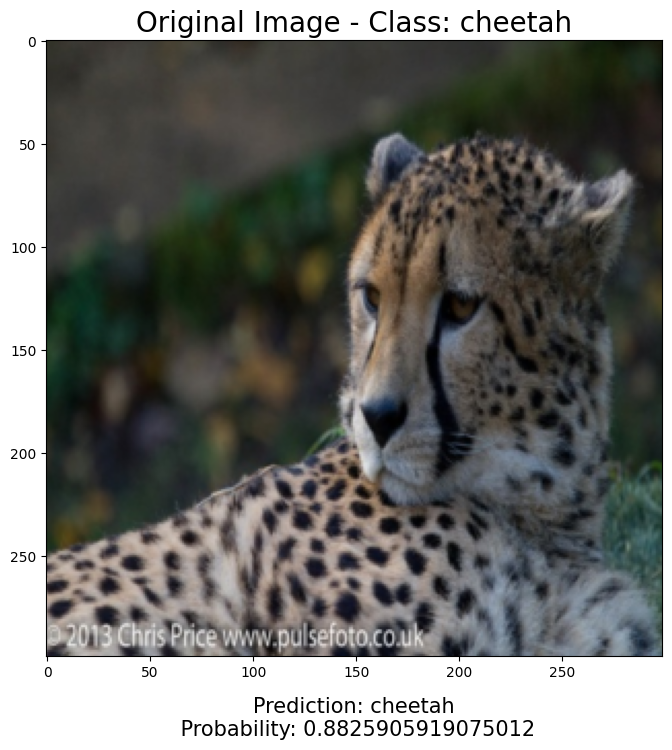

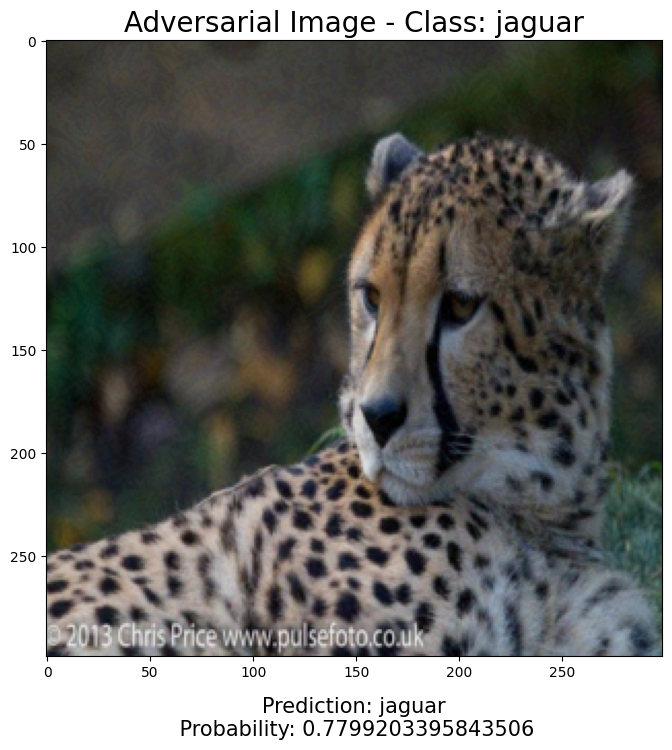

In [34]:
eps = 0.05
y_true = 293   #cheetah  
target = Variable(torch.LongTensor([y_true]), requires_grad=False)
print(target)

# Your code here
import matplotlib.pyplot as plt

# Original image and label
original_image = img_variable  
original_output = inceptionv3(original_image)
original_label_idx = torch.max(original_output.data, 1)[1][0]
original_pred_prob = torch.max(F.softmax(original_output, dim=1).data, 1)[0][0]
original_label = labels[original_label_idx]

# adversarial image
adversarial_image = original_image.clone().detach().requires_grad_(True)
loss = F.cross_entropy(inceptionv3(adversarial_image), target)
loss.backward()
adversarial_image.data = adversarial_image.data + eps * torch.sign(adversarial_image.grad.data)


adversarial_output = inceptionv3(adversarial_image)
adversarial_label_idx = torch.max(adversarial_output.data, 1)[1][0]
adversarial_pred_prob = torch.max(F.softmax(adversarial_output, dim=1).data, 1)[0][0]
adversarial_label = labels[adversarial_label_idx]

# Visualize
visualize(original_image.detach(), "Original Image - Class: " + original_label, original_label, original_pred_prob)
visualize(adversarial_image.detach(), "Adversarial Image - Class: " + adversarial_label, adversarial_label, adversarial_pred_prob)


Here is a visualization routine that might help you draw the original and adversarial inputs. (Feel free to modify its code if necessary!)

In [14]:
def visualize(x, title, y, prob):
    x = x.squeeze(0)     #remove batch dimension # B X C H X W ==> C X H X W
    x = x.mul(torch.FloatTensor(std).view(3,1,1)).add(torch.FloatTensor(mean).view(3,1,1)).numpy()#reverse of normalization op- "unnormalize"
    x = np.transpose( x , (1,2,0))   # C X H X W  ==>   H X W X C
    x = np.clip(x, 0, 1)
    figure, ax = plt.subplots(1,1, figsize=(18,8))
    ax.imshow(x)
    ax.set_title(title, fontsize=20)
    ax.text(0.5,-0.13, "Prediction: {}\n Probability: {}".format(y, prob), size=15, ha="center", 
         transform=ax.transAxes)
    plt.show()

#### Q2: Now apply untargeted FGSM on the cheetah image for a few other values of $\epsilon$. Qualitatively evaluate your findings, and visualize the results for the lowest possible value of $\epsilon$ for which you interesting results (i.e., the network produces a wrong output with high cofidence).   (5 points) 

Epsilon = 0.01


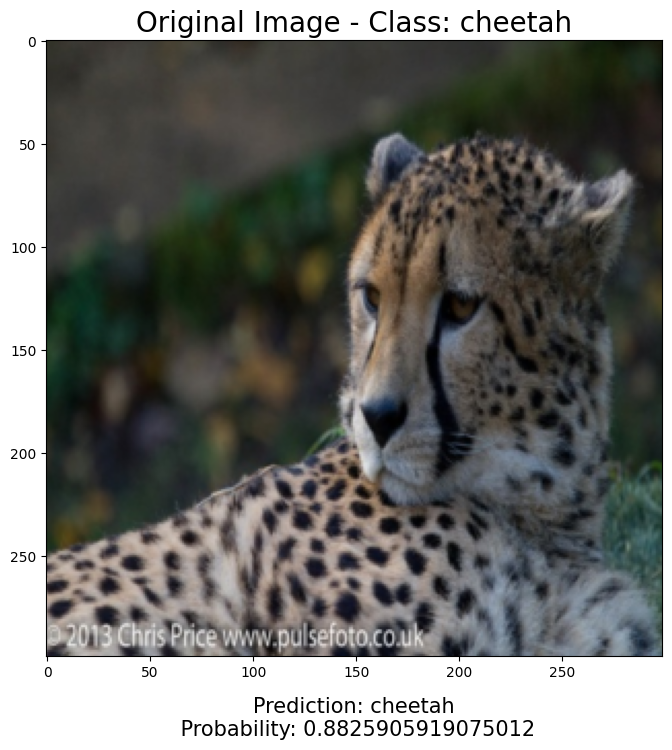

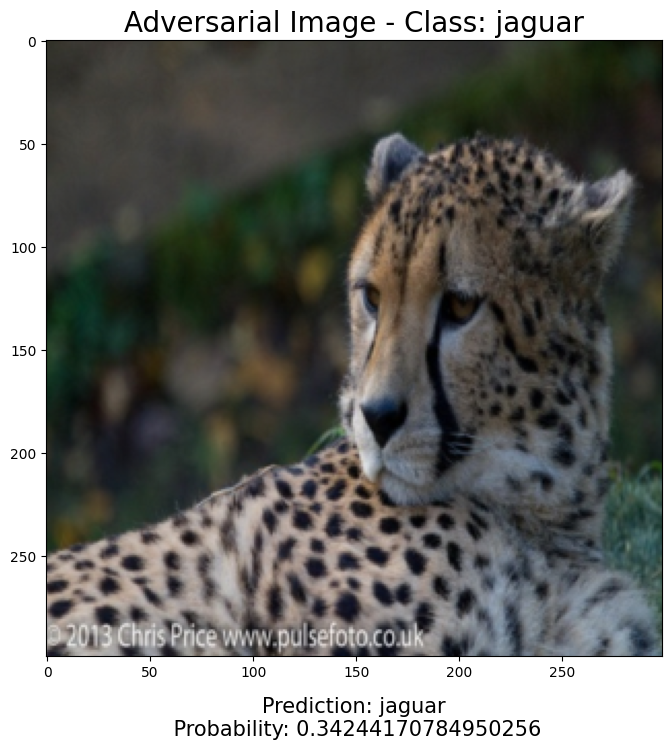

Original Label: cheetah, Adversarial Label: jaguar
Original Prediction Probability: 0.8826, Adversarial Prediction Probability: 0.3424
----------------------------------------
Epsilon = 0.02


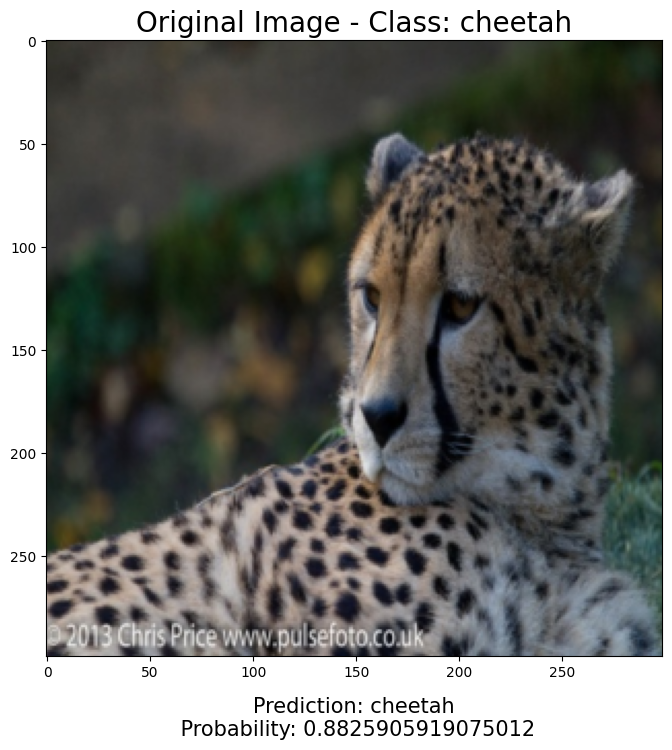

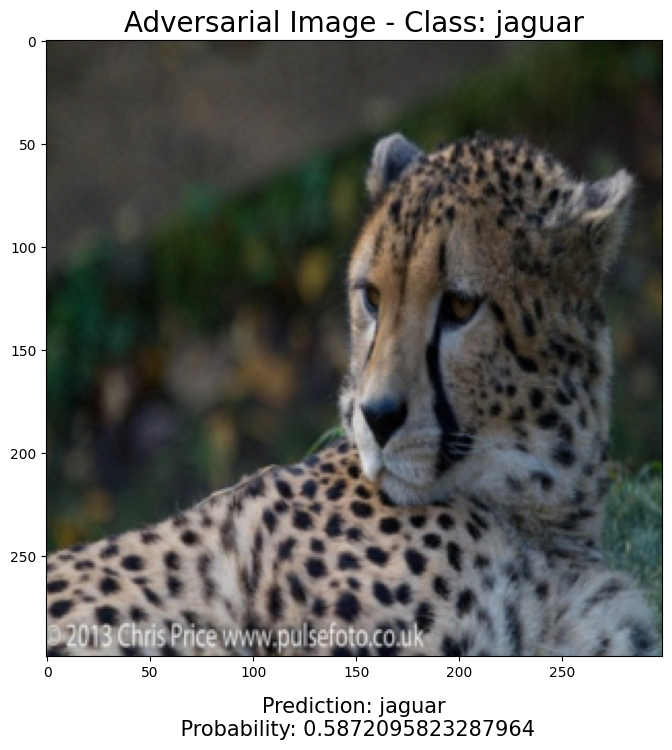

Original Label: cheetah, Adversarial Label: jaguar
Original Prediction Probability: 0.8826, Adversarial Prediction Probability: 0.5872
----------------------------------------
Epsilon = 0.03


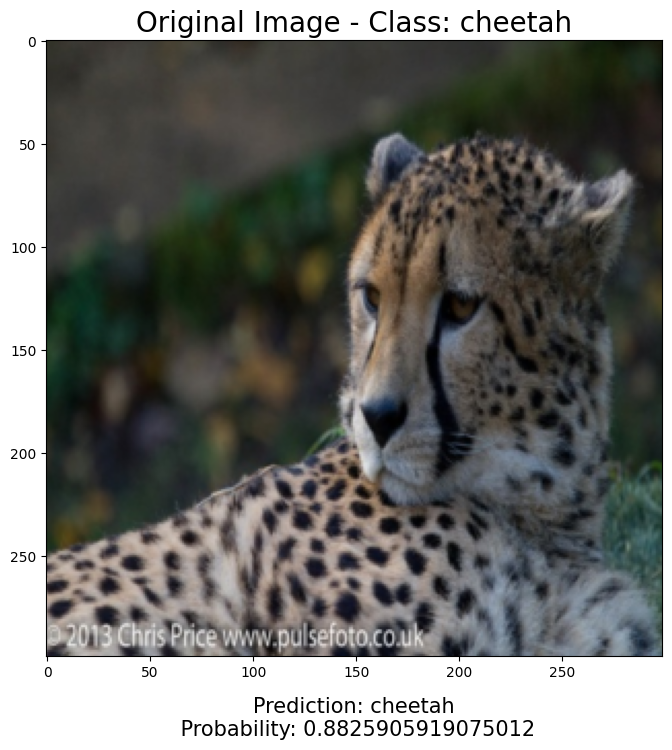

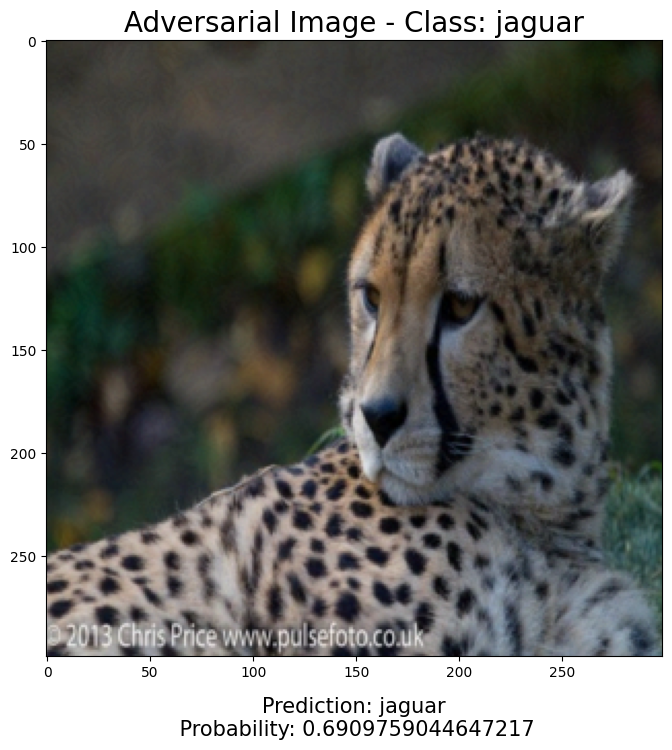

Original Label: cheetah, Adversarial Label: jaguar
Original Prediction Probability: 0.8826, Adversarial Prediction Probability: 0.6910
----------------------------------------
Epsilon = 0.04


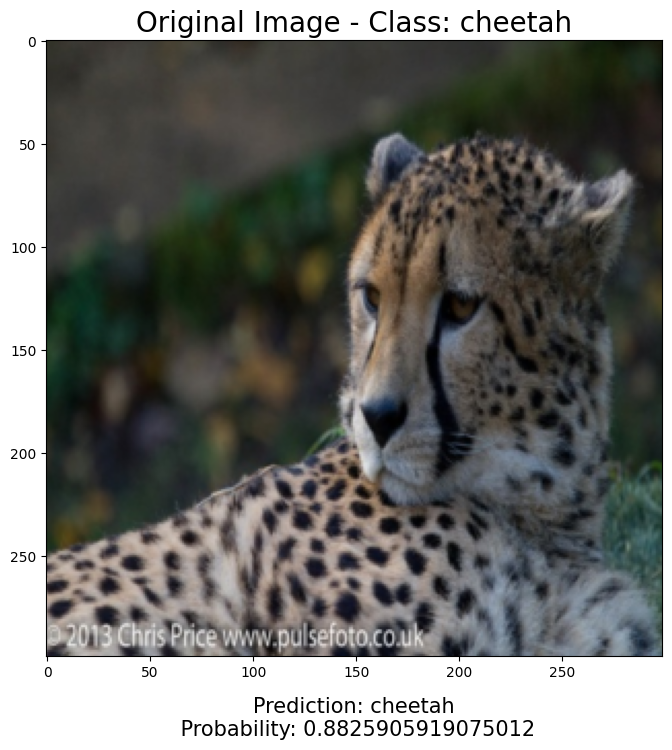

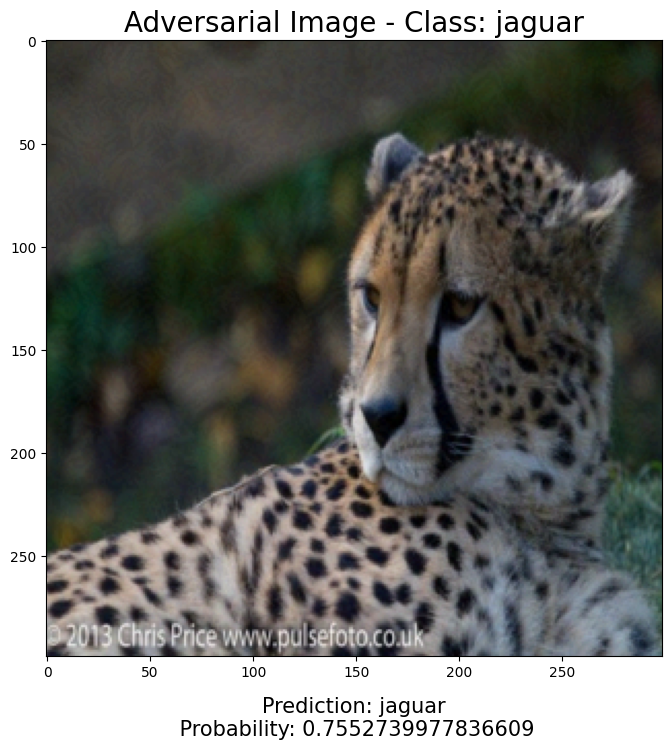

Original Label: cheetah, Adversarial Label: jaguar
Original Prediction Probability: 0.8826, Adversarial Prediction Probability: 0.7553
----------------------------------------
Epsilon = 0.05


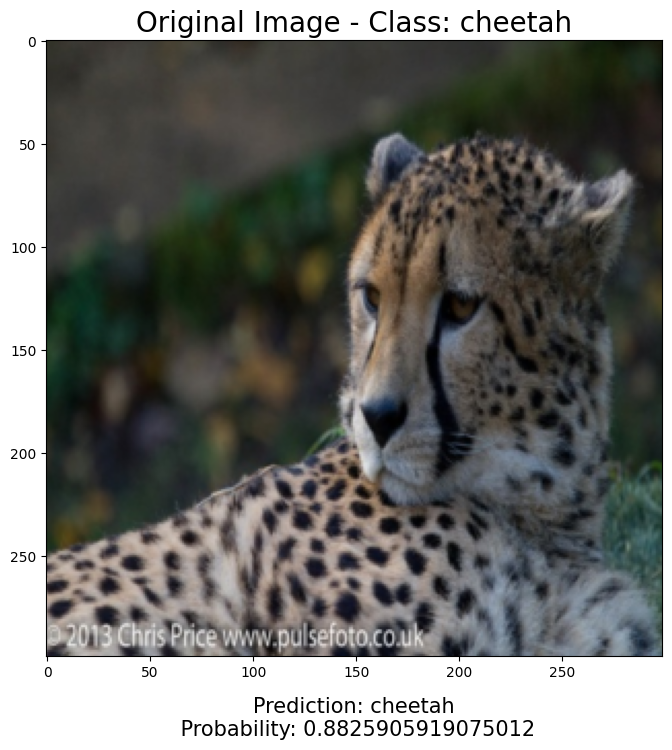

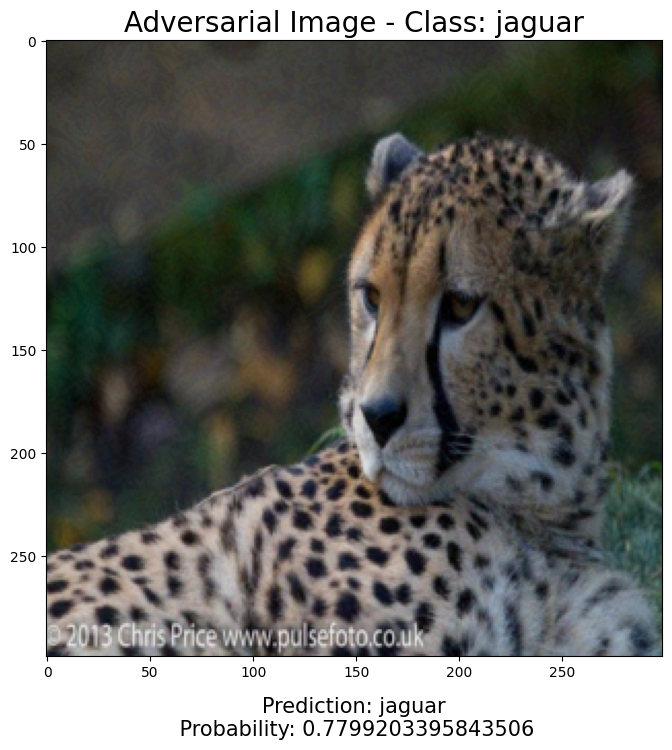

Original Label: cheetah, Adversarial Label: jaguar
Original Prediction Probability: 0.8826, Adversarial Prediction Probability: 0.7799
----------------------------------------


In [35]:
import numpy as np

# epsilons to iterate and test
epsilons = [0.01, 0.02, 0.03, 0.04, 0.05]

for eps in epsilons:
    adversarial_image = original_image.clone().detach().requires_grad_(True)
    loss = F.cross_entropy(inceptionv3.forward(adversarial_image), target)
    loss.backward()
    adversarial_image.data = adversarial_image.data + eps * torch.sign(adversarial_image.grad.data)
    adversarial_output = inceptionv3(adversarial_image)
    adversarial_label_idx = torch.max(adversarial_output.data, 1)[1][0]
    adversarial_pred_prob = torch.max(F.softmax(adversarial_output, dim=1).data, 1)[0][0]
    adversarial_label = labels[adversarial_label_idx]

    # output results
    print(f"Epsilon = {eps}")
    visualize(original_image.detach(), "Original Image - Class: " + original_label, original_label, original_pred_prob)
    visualize(adversarial_image.detach(), "Adversarial Image - Class: " + adversarial_label, adversarial_label, adversarial_pred_prob)


    print(f"Original Label: {original_label}, Adversarial Label: {adversarial_label}")
    print(f"Original Prediction Probability: {original_pred_prob:.4f}, Adversarial Prediction Probability: {adversarial_pred_prob:.4f}")
    print("-" * 40)


## Targeted FGSM

Now you will investigate the targeted version of FGSM. Using the same class as `img_hyena` (we will call this class t) from JSON file listing classes, and then perform the exercises below.

#### Q3: Now perform a targeted FGSM attack, with the cheetah image as the original image and t as the target class, on the model. Display the original input, the perturbed input, the output classes in the two cases, and the corresponding probabilities. You can select the value of $\epsilon$ as you need to get interesting results. (10 points)

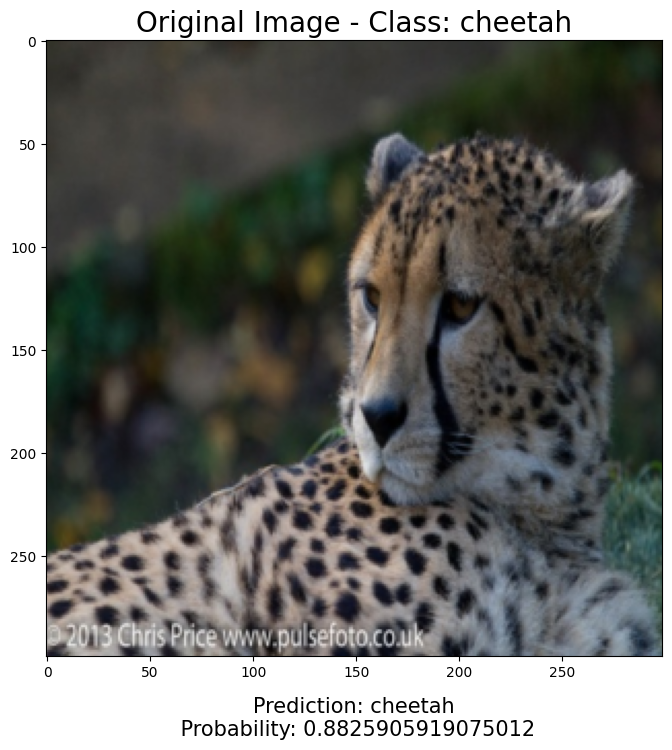

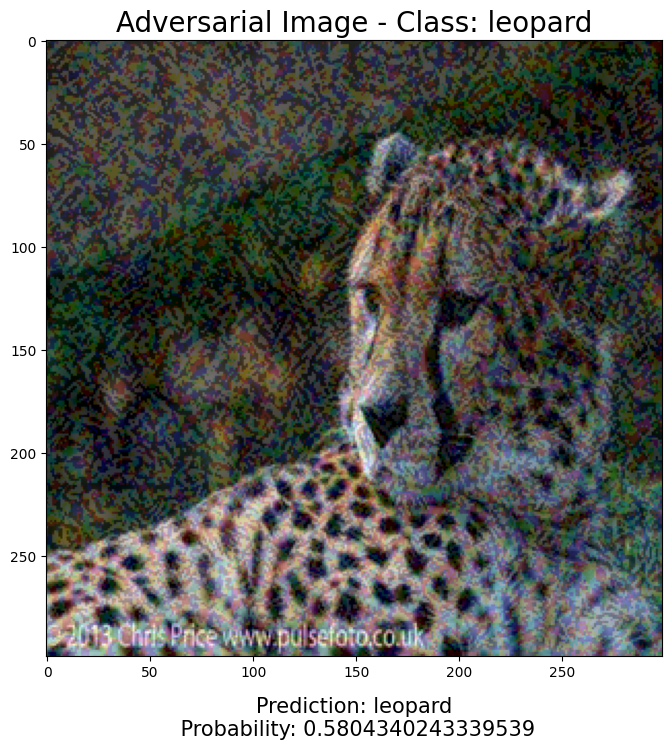

Original Label: cheetah, Adversarial Label: leopard
Original Prediction Probability: 0.8826, Adversarial Prediction Probability: 0.5804


In [36]:
# Your code here

eps = 0.4  
t = 276

target = torch.LongTensor([t])

original_image = img_variable  
original_output = inceptionv3(original_image)
original_label_idx = torch.max(original_output.data, 1)[1][0]
original_pred_prob = torch.max(F.softmax(original_output, dim=1).data, 1)[0][0]
original_label = labels[original_label_idx]

# adversarial image
adversarial_image = original_image.clone().detach().requires_grad_(True)
loss = F.cross_entropy(inceptionv3(adversarial_image), target)
loss.backward()
adversarial_image.data = adversarial_image.data - eps * torch.sign(adversarial_image.grad.data)


adversarial_output = inceptionv3(adversarial_image)
adversarial_label_idx = torch.max(adversarial_output.data, 1)[1][0]
adversarial_pred_prob = torch.max(F.softmax(adversarial_output, dim=1).data, 1)[0][0]
adversarial_label = labels[adversarial_label_idx]

# Visualize 
visualize(original_image.detach(), "Original Image - Class: " + original_label, original_label, original_pred_prob)
visualize(adversarial_image.detach(), "Adversarial Image - Class: " + adversarial_label, adversarial_label, adversarial_pred_prob)


print(f"Original Label: {original_label}, Adversarial Label: {adversarial_label}")
print(f"Original Prediction Probability: {original_pred_prob:.4f}, Adversarial Prediction Probability: {adversarial_pred_prob:.4f}")


## Untargeted, Iterated FGSM

#### Q4: Now consider a version of the untargeted FGSM attack where you iteratively update the original cheetah image using the FGSM formula. However, you reduce the step size used in each iteration --- i.e., rather than an update $x := x + \epsilon \nabla_x (Loss(x))$, you use an update $x := x + \alpha \nabla_x (Loss(x))$, where $\alpha < \epsilon$ is a suitable hyperparameter. Of course, you need to make sure that the perturbed image falls within a $\pm \epsilon$ interval of the original input. However, suppose you implement this naively, by just rounding down or up any value that falls outside the above interval. 

#### Report on your results (i.e., the original and perturbed inputs, their classification, and the corresponding probabilities) from this experiment.  You can select the method's hyperparameters ($\epsilon$, $\alpha$, and the number of iterations) as you see fit, with the goal of getting interesting results.      (10 points)

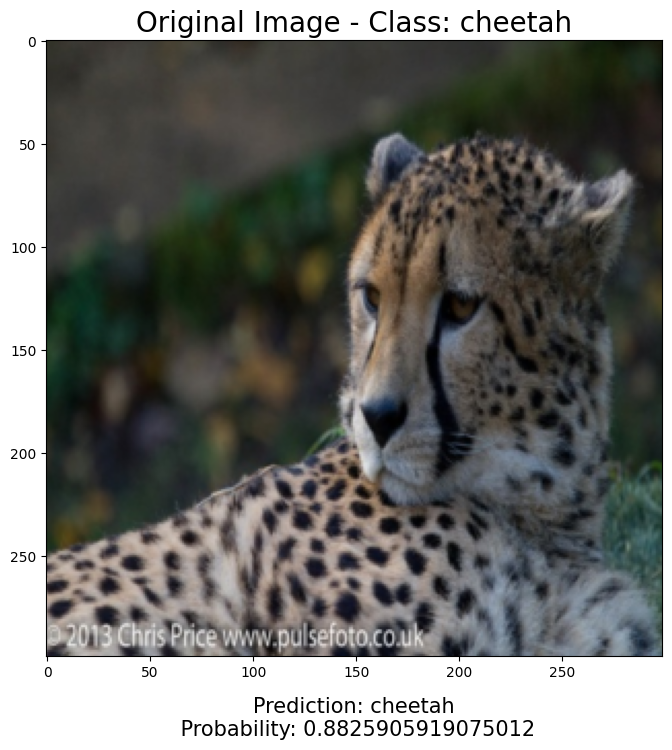

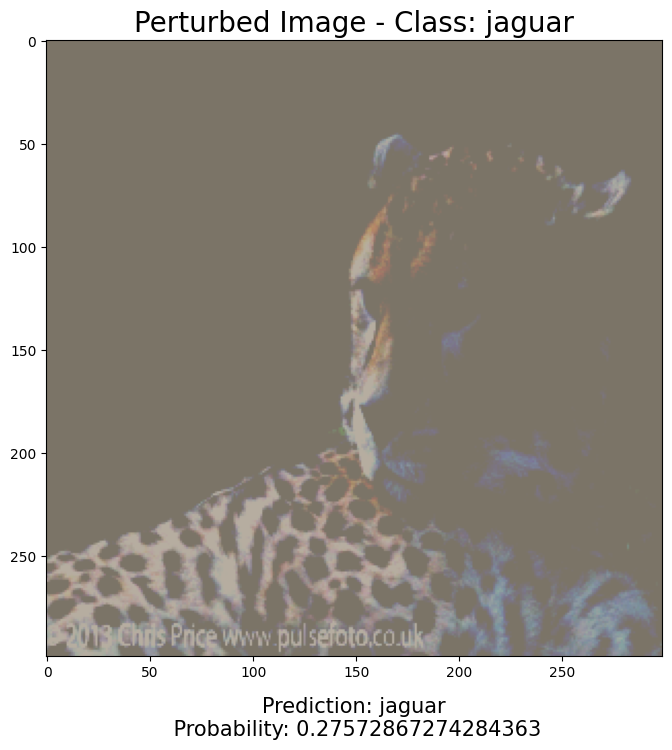

In [29]:
# Your code here


target_class_index = 293
max_iterations = 100


eps = 0.1
epsilon_decay = 0.9


original_image = img_variable  
original_output = inceptionv3(original_image)
original_label_idx = torch.max(original_output.data, 1)[1][0]
original_pred_prob = torch.max(F.softmax(original_output, dim=1).data, 1)[0][0]
original_label = labels[original_label_idx]

adversarial_image = original_image.clone().detach().requires_grad_(True)

for iteration in range(max_iterations):
    loss = F.cross_entropy(inceptionv3(adversarial_image), torch.LongTensor([target_class_index]))
    loss.backward()
    # Reduce epsilon iteratively by decay rate
    eps *= epsilon_decay
    adversarial_image.data = original_image + eps * torch.sign(adversarial_image.grad.data)
    adversarial_image.data = torch.clamp(adversarial_image.data, 0.0, 1.0)
    adversarial_output = inceptionv3(adversarial_image)
    adversarial_label_idx = torch.max(adversarial_output.data, 1)[1][0]
    adversarial_pred_prob = torch.max(F.softmax(adversarial_output, dim=1).data, 1)[0][0]
    if adversarial_label_idx != original_label_idx:
        break


visualize(original_image.detach(), "Original Image - Class: " + labels[original_label_idx], labels[original_label_idx], original_pred_prob)
visualize(adversarial_image.detach(), "Perturbed Image - Class: " + labels[adversarial_label_idx], labels[adversarial_label_idx], adversarial_pred_prob)


REPORT YOUR RESULTS HERE 

## Iterated, targeted FGSM

#### Q5: Now repeat the experiments in Q4 with a targeted version of FGSM with "hyena" as the target class.  (10 points)

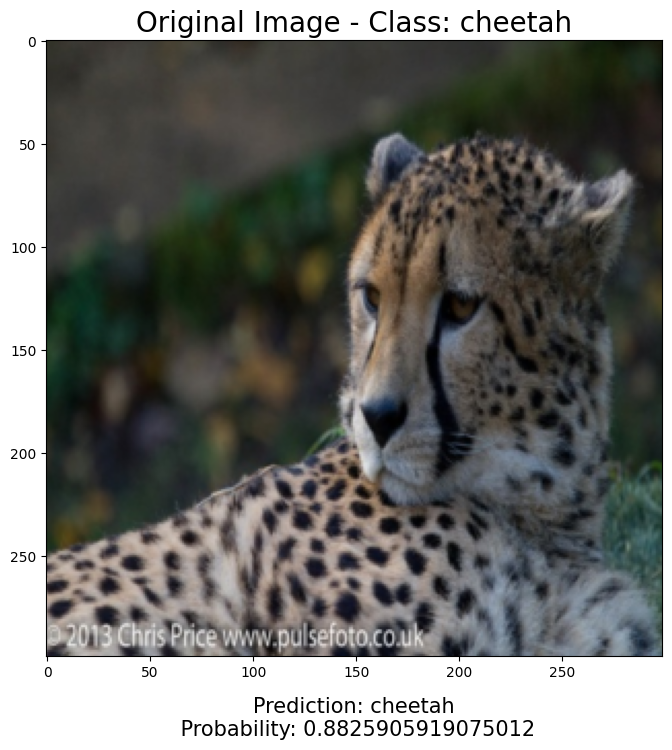

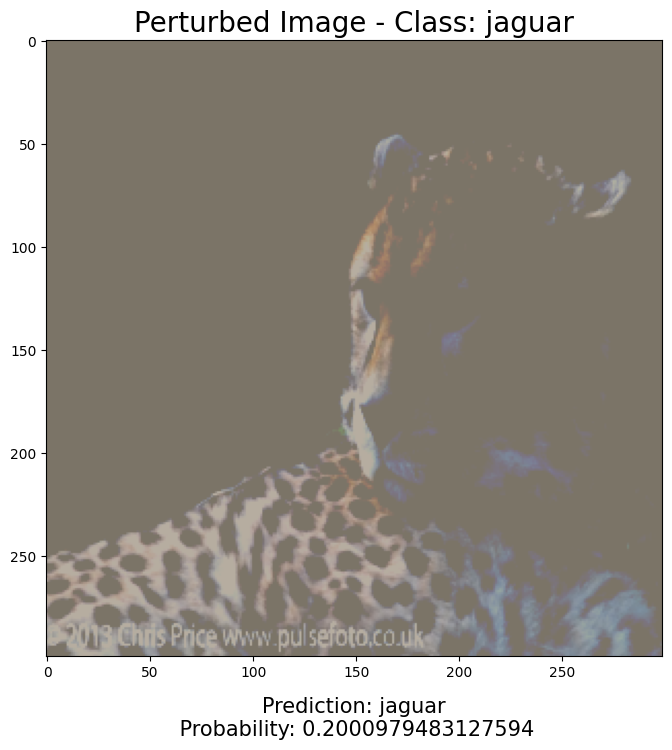

In [37]:
# YOUR CODE HERE 


target_class_index = 276 #hyena index
max_iterations = 250

eps = 0.6 
epsilon_decay = 0.3

# Original image and label
original_image = img_variable  # Assuming 'img_variable' is the original cheetah image
original_output = inceptionv3(original_image)
original_label_idx = torch.max(original_output.data, 1)[1][0]
original_pred_prob = torch.max(F.softmax(original_output, dim=1).data, 1)[0][0]
original_label = labels[original_label_idx]

# Initialize adversarial image
adversarial_image = original_image.clone().detach().requires_grad_(True)

for iteration in range(max_iterations):
    loss = F.cross_entropy(inceptionv3(adversarial_image), torch.LongTensor([target_class_index]))
    loss.backward()
    eps *= epsilon_decay
    adversarial_image.data = original_image + eps * torch.sign(adversarial_image.grad.data)
    adversarial_image.data = torch.clamp(adversarial_image.data, 0.0, 1.0)
    adversarial_output = inceptionv3(adversarial_image)
    adversarial_label_idx = torch.max(adversarial_output.data, 1)[1][0]
    adversarial_pred_prob = torch.max(F.softmax(adversarial_output, dim=1).data, 1)[0][0]
    if adversarial_label_idx == target_class_index:
        break


visualize(original_image.detach(), "Original Image - Class: " + labels[original_label_idx], labels[original_label_idx], original_pred_prob)
visualize(adversarial_image.detach(), "Perturbed Image - Class: " + labels[adversarial_label_idx], labels[adversarial_label_idx], adversarial_pred_prob)


REPORT RESULTS HERE

## Summary

#### Q6: Summarize your findings in the above experiments. Which attack did you find the most effective? Propose (in text) some natural variations of the attacks that, in your opinion, might make them even more effective. (5 points) 

#### Your answer here 

I found untargeted FGSM to be, suprisingly to me, the most effective in producing a nearly identical image which was classified most confidently by the classifier to an INCORRECT label. For the targeted and iterative attacks, while the classifier did fail in the sense that it predicted the wrong category, the confidence levels were fairly low. Additionally, the images seemed quite perturbed to the human eye. No, the cheetah didn't look like a lynx, but you can defintely tell the photo was a bit wonky. 

However, the adverserial image generated by untargeted FGSM seems identical to me, yet completely fools the classifier, which predicts jaguar with nearly 80% confidence.

One way to make the attacks even more effective would be to add in a degree of randomness. Since FGSM uses gradient descent, this can be guarded against using a similar computational strategy. By adding in some randomness to the changes to the image, this makes preventing the attack tougher and harder to predict. 


## Part 2: Theoretical Questions

#### Q7: In class, you have seen the use of "Boxes" for certifying neural networks. For vectors $a, b \in R^m$ with $\forall i. a_i \le b_i$,  the box $[a,b]$ is a hypercube in $R^m$. We also saw how to use abstract transformers to obtain an overapproximation of the behavior of a function. Given a function $f : R^n \rightarrow R^m$ and an input box $[a, b] \subset R^n$, a sound abstract transformer $f^\#$ finds $[c, d] \subset R^m$ such that $\forall x \in [a, b]. f(x) \in [c, d]$.

#### EXAMPLE: let $x ∈ [1, 3]$ and $y ∈ [2, 4]$, and assume we want to approximate the result of $(2x − y)$. Using the basic abstract transformers from the lecture, we can compute $2 \cdot^\# [1,3] -^\# [2,4] = [2,6] +^\# [-4, -2] =  [-2, 4]$. This lets us conclude that $2x − y ∈ [−2, 4]$.

#### Now solve the following problems. (20 points)

#### (i) Show that the box transformers lose precision, by approximating the outcome of $(x − x)$. 

#### (ii) Prove or disprove: The alternative transformer $[a, b] +' [c, d] = [a + c, b + |d|]$ for addition is sound (i.e., the output box is an over-approximation of all possible result values).

#### (iii) Prove or disprove: The alternative transformer $[a, b] +'' [c, d] = [−\infty, a + b + d]$ for addition is sound.

#### (iv) Derive a sound abstract transformer $f^\#$ for the function $f(x) := x^2$. That is, derive expressions for $g$, $h$ such that $[g, h] = f^\#([a, b])$ for $a, b \in R$.   

#### ANSWERS 

(i) We have: f(x) = x - x = 0

Now, using the basic abstract transformers, we can compute:

x - x = [a, b] - [a, b] = [a - b, b - a]

Since x - x is always equal to 0 for any x, the exact result is the constant 0. However, the box transformer approximation gives us the interval [a - b, b - a], which is not a single point and thus loses precision. This demonstrates that box transformers can lose precision for certain functions.

(ii) 

For addition, the range of possible values for the sum of two numbers is always wider than the sum of their individual ranges. In other words, if x is in [a, b] and y is in [c, d], then x + y is guaranteed to be in the interval [a + c, b + d]. The absolute value of d is used to account for the possibility that y could be negative, which ensures that the result is an over-approximation.

So, the alternative transformer [a, b] +' [c, d] = [a + c, b + |d|] for addition is sound.

(iii)  

In this case, the transformer produces the interval [-∞, a + b + d]. The use of negative infinity means that the lower bound of the result is unbounded, which is problematic. This transformer does not provide a sound over-approximation because it fails to constrain the lower bound of the result. As a result, it is not a sound abstract transformer for addition.

(iv) To derive a sound abstract transformer $f^#$ for the function $f(x) = x^2$ over the interval [a, b], we find expressions for g and h such that [g, h] = $f^#([a, b])$ for $a, b \in R$.

Calculate f(a) and f(b):
$f(a) = a^2$
$f(b) = b^2$

Calculate the derivative: $f'(x) = 2x$.

Calculate the possible derivative range over [a, b]: $[2a, 2b]$

Now, use these values to approximate f:

$g = \min(a^2, b^2, 2a^2, 2b^2) = a^2$

$h = \max(a^2, b^2, 2a^2, 2b^2) = 2b^2$

So, the sound abstract transformer $f^#([a, b])$ for $f(x) = x^2$ is given by [$a^2$, $2b^2$], providing a sound over-approximation of the function's behavior over [a, b].

#### Q8: Consider the maxpool operation defined as $y := \max(x_1, x_2)$, which computes the maximum of two input neurons x1, x2 ∈ R. This operation is typically used in neural networks to reduce dimensionality. In this task, you are going to extend box verification to the maxpool operation.

#### (i) Derive a sound abstract transformer $\max^\#$ for the maxpool operation in the box domain. That is, derive expressions for $y_1$, $y_2$ such that $[y_1, y_2] = \max^\# ([a_1, b_1], [a_2, b_2])$ for $a_1, b_1, a_2, b_2 \in R$. Your transformer should be as precise as possible.

#### (ii) Consider the neural network defined below. The network takes inputs $x_1$, $x_2$ and produces outputs $x_9$, $x_{10}$. It consists of both linear and maxpool layers. 

<img src="network.png" width="400">

#### Assume we want to prove that for all values of $x_1, x_2 \in [0, 1]$, the output satisfies $x_9 > x_{10}$. Using your abstract transformer for $\max$ from above, try to prove the property by performing verification in the box domain. Does the proof succeed?   (20 points)

(i) To derive a sound abstract transformer for the maxpool operation in the box domain, I considered computing the maximum of two input intervals [a1, b1] and [a2, b2]. The result of the maxpool operation is a new interval [y1, y2].

The maximum of two intervals is defined as follows:

- y1 is the maximum of the lower bounds of the two intervals: y1 = max(a1, a2).
- y2 is the maximum of the upper bounds of the two intervals: y2 = max(b1, b2).

So, the abstract transformer for the maxpool operation in the box domain is: [max#([a1, b1], [a2, b2]) = [max(a1, a2), max(b1, b2)].

(ii) Let's analyze the network's layers one by one:

- x1 and x2 are constrained to the interval [0, 1].
- x3 := x1 + x2 results in [0, 2] .
- x4 := x1 - 2 results in [-2, -1].
- x5 := x1 - x2 results in [-1, 1].
- x6 := x2 , which is [0, 1].
- x7 := max(x3, x4) uses: [max#([0, 2], [-2, -1]) = [0, 2].
- x8 := max(x5, x6) uses: [max#([-1, 1], [0, 1]) = [0, 1].
- x9 := x7 just takes the interval of x7, which is [0, 2].
- x10 := -x7 + x8 - 0.5 which is: [-x7, x8] = [-2, 0.5].

So, we have:
- x9 has the interval [0, 2].
- x10 has the interval [-2, 0.5].

Since [0, 2] is entirely greater than [-2, 0.5], We can conclude that for all values of (x1, x2) in [0, 1], (x9 > x10).

So, the proof succeeds, and the property holds in the given input domain.


## Feedback: Optional 
We hope to continue teaching this course in future semesters, so your feedback is appreciated. In the space below, please write how many hours you spent on this assignment, how challenging you felt the assignment was, and what did you find challenging about it (if antything at all). 

#### HOURS SPENT: <FILL IN HERE>
This lab was very cool. I enjoyed it and it didn't take too long.